In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#Load job market
df = pd.read_csv('job-market.csv')
# All 4000 rows were being loaded, so below code to remove them
df = df.dropna(how='all')
df.shape

(10099, 13)

Text(0.5, 0, 'Number of Postings')

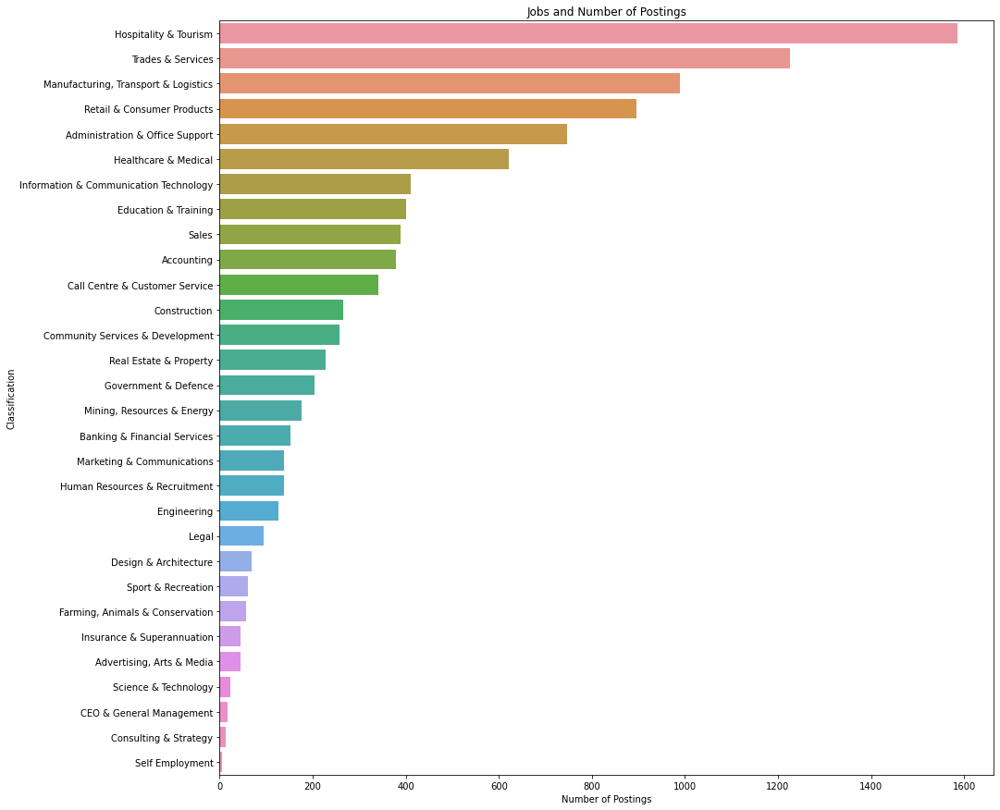

In [3]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(15,15))
sns.countplot(y='Classification',
              data=df, 
              order=df["Classification"].value_counts().index).set(title='Jobs and Number of Postings')
ax.set_xlabel('Number of Postings')

In [4]:
import matplotlib
#create dataframe for salary ranges

SalaryDf = df[df['LowestSalary'].isna()==False]
SalaryDf = SalaryDf.groupby('LowestSalary').count()
SalaryDf['Label'] = SalaryDf.index
SalaryDf['Count'] = SalaryDf["Id"]
SalaryDf.head()

,Id,Title,Company,Date,Location,Area,Classification,SubClassification,Requirement,FullDescription,HighestSalary,JobType,Label,Count
LowestSalary,,,,,,,,,,,,,,
0.0,3894,3894,3571,3894,3894,2560,3894,3894,3894,3737,3894,3740,0.0,3894
30.0,1842,1842,1779,1842,1842,1082,1842,1842,1842,1815,1842,1816,30.0,1842
40.0,2519,2519,2373,2519,2519,1516,2519,2519,2519,2474,2519,2475,40.0,2519
50.0,1844,1844,1760,1844,1844,1234,1844,1844,1844,1817,1844,1821,50.0,1844


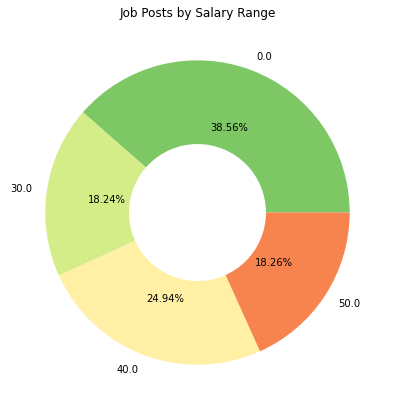

In [5]:
#salary ranges plot
# creating colours for plot
cmap = plt.get_cmap('RdYlGn_r')
outer_colors = cmap(np.array([60,100,140,195]))
# setting plot size
fig, ax = plt.subplots(figsize=(7,7))
# Creating pie plot
plt.pie(SalaryDf['Count'],
        labels= SalaryDf['Label'],
        autopct='%1.2f%%', pctdistance=0.6,
        colors=outer_colors)
# creating white circle in the middle to make donut plot
centre_circle = plt.Circle((0, 0), 0.45, fc='white')
fig = plt.gcf()
plt.title('Job Posts by Salary Range')
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)

In [7]:
locationDf = df[df['Location'].isna()==False]
locationDf = locationDf.groupby('Location').count()
locationDf['Label'] = locationDf.index
locationDf['Count'] = locationDf["Id"]
locationDf.head()

,Id,Title,Company,Date,Area,Classification,SubClassification,Requirement,FullDescription,LowestSalary,HighestSalary,JobType,Label,Count
Location,,,,,,,,,,,,,,
ACT,238,238,235,238,0,238,238,238,235,238,238,236,ACT,238
Adelaide,390,390,356,390,0,390,390,390,374,390,390,374,Adelaide,390
Adelaide Hills & Barossa,19,19,18,19,0,19,19,19,19,19,19,19,Adelaide Hills & Barossa,19
Albany & Great Southern,10,10,10,10,0,10,10,10,10,10,10,10,Albany & Great Southern,10
Albury Area,19,19,18,19,0,19,19,19,19,19,19,19,Albury Area,19


In [8]:
%matplotlib inline
# Pie char for job market share of cities
from matplotlib import cm



Text(0.5, 1.0, 'Market share of locations')

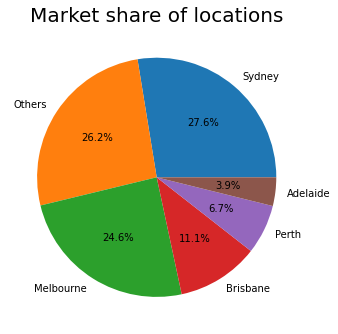

In [9]:

locationDf.loc[locationDf['Count'] < 300, 'Label'] = 'Others'
locationDf= locationDf.groupby('Label')['Count'].sum().reset_index()
locationDf = locationDf.sort_values(['Count'], ascending=[False])

fig, ax = plt.subplots(figsize=(5.5,5.5))
plt.pie(locationDf['Count'], labels=locationDf['Label'], autopct='%1.1f%%')
plt.title('Market share of locations', fontsize= 20)

In [24]:
# Data Correlation
wine = pd.read_csv('wine.data.csv')
label = wine[wine.columns[0]]
wine = wine.drop(columns = wine.columns[0])
wine.head()

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


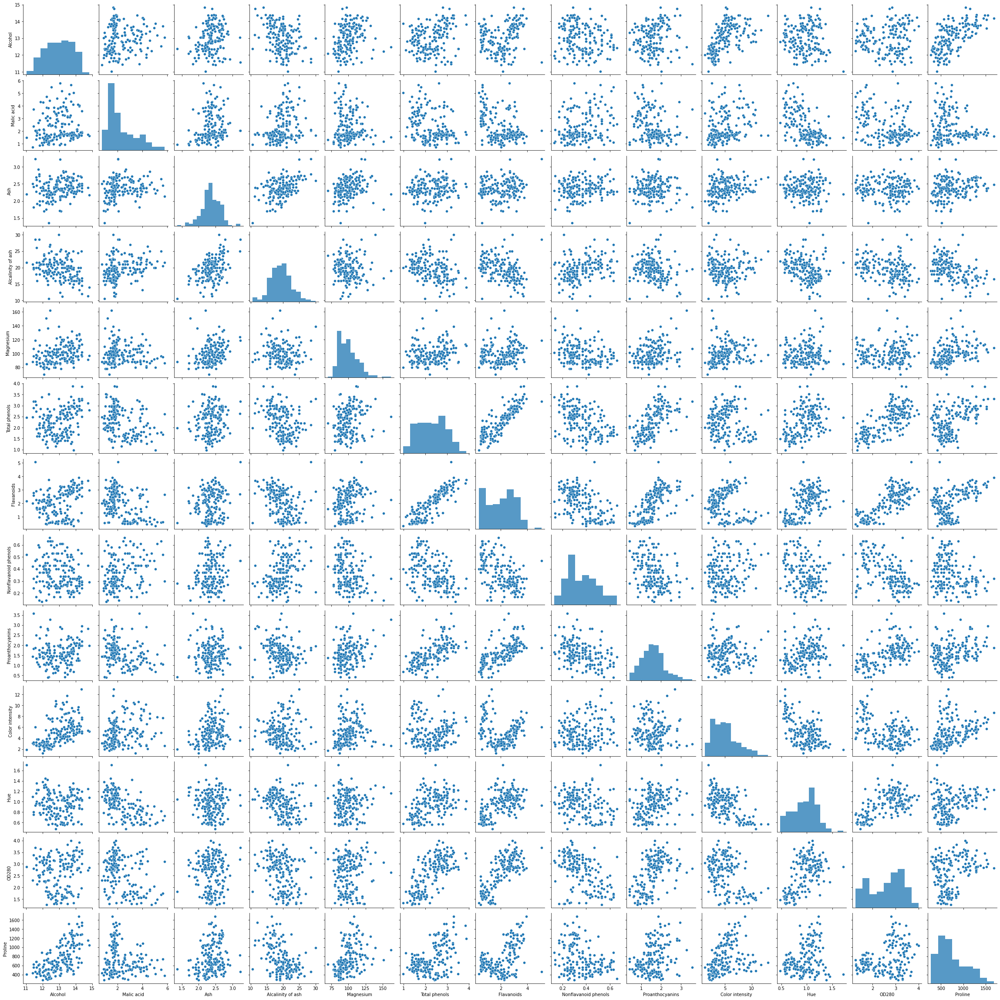

In [25]:
# Scatter Plot
ax = sns.pairplot(wine, diag_kws=dict(linewidth=0))

The above plot is pair plot depicting scatter plots and histograms of the data attributes. The histogram on the diagonal allows us to see the distribution of a single variable while the scatter plots on the upper and lower triangles show the relationship between two variables. In this case, the relation between alcohol and proline is a positive one as both of them are increasing in value together. One can say that increase in alcohol drastically increases proline. As can be seen from the histogram, malic acid distribution is slightly left skewed. Even the scatter plots of malic acid with other attributes show a negative relation as it increase in number decreases the other attributes.

<AxesSubplot:>

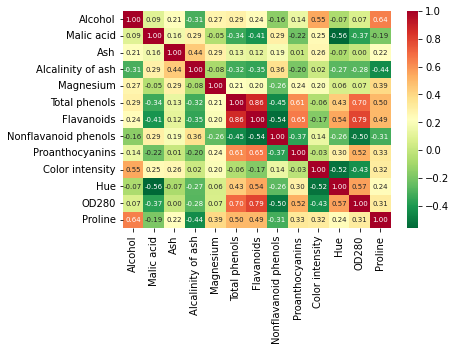

In [26]:
# Heat map
sns.heatmap(wine.corr(),cmap='RdYlGn_r', fmt='.2f', annot=True, annot_kws={"fontsize":7})

The above heat map depicts the correlation between each attribute. The higher the number, the better the correlation. Three pairs with highest correlation are:
1) Flavanoids and Total phenols - 0.86
2) Flavanoids and OD280 - 0.79
3) Total phenols and OD280 - 0.7 

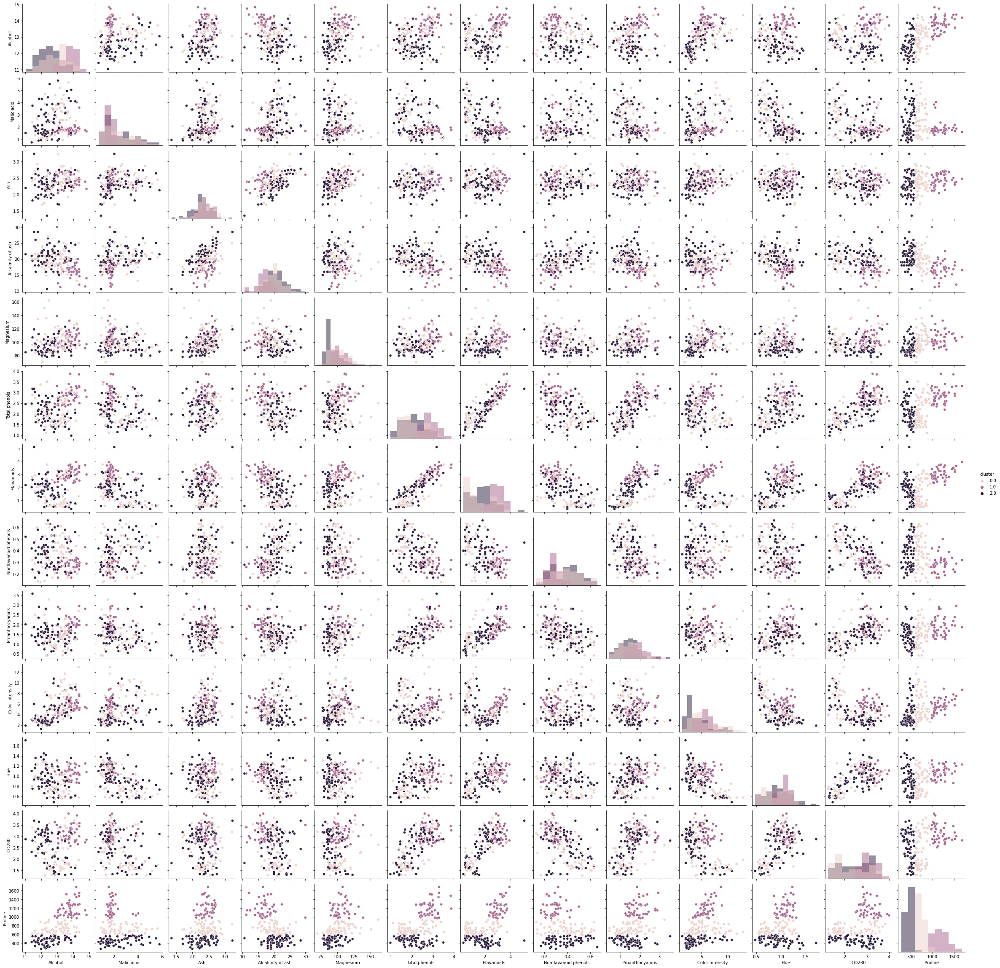

In [27]:
#Kmeans
from sklearn.cluster import KMeans
kMeansClustering = KMeans(n_clusters = 3, random_state=0)
label_pred_KM = kMeansClustering.fit_predict(wine)
wine ["cluster"] = label_pred_KM.astype('float64')
sns_plot = sns.pairplot(wine, hue = "cluster", diag_kws=dict(linewidth=0), diag_kind="hist")

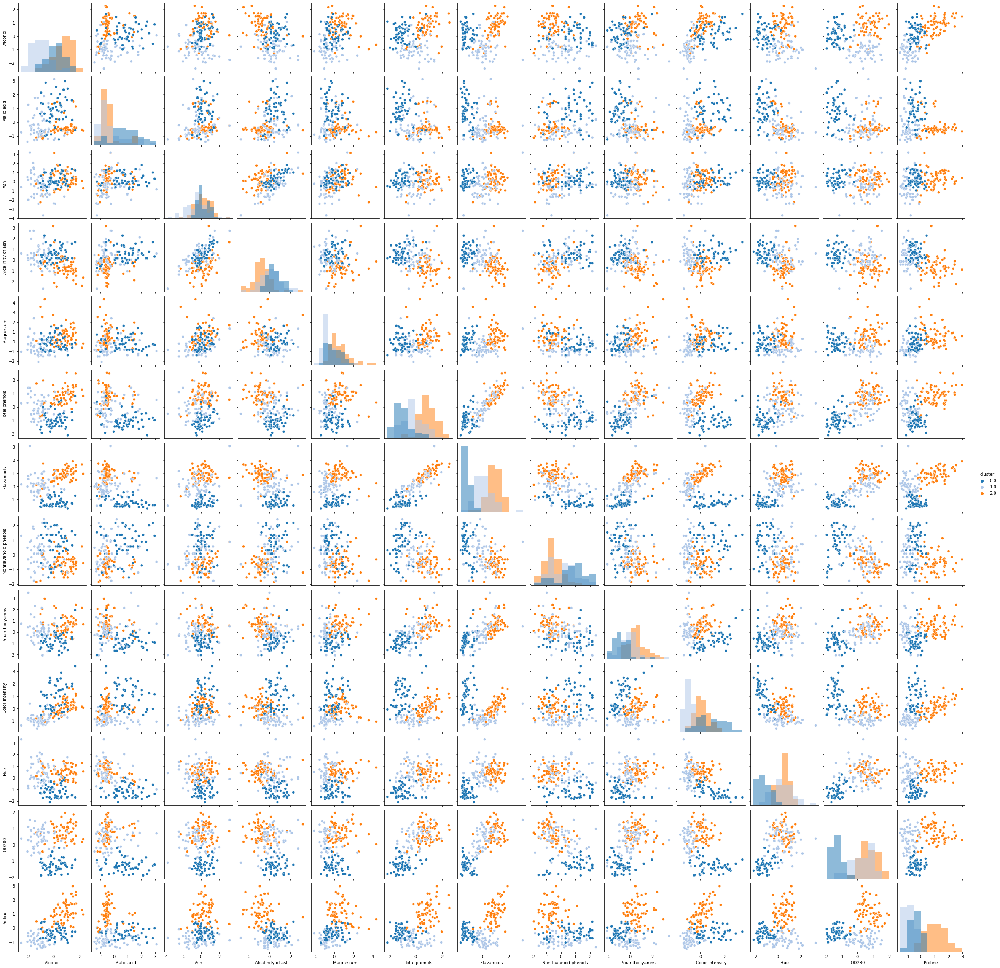

In [28]:
# Normalized Data
from sklearn import preprocessing

standardScaler = preprocessing.StandardScaler()
standardScaler.fit(wine)
X_scaled_array = standardScaler.transform(wine)
normalizedData = pd.DataFrame(X_scaled_array, columns = wine.columns)

kMeansClustering = KMeans(n_clusters = 3, random_state=0)
label_pred_KM_nor = kMeansClustering.fit_predict(normalizedData)
normalizedData["cluster"] = label_pred_KM_nor.astype('float64')
sns.pairplot(normalizedData, hue = "cluster",palette= sns.color_palette("tab20", 3),diag_kind="hist", diag_kws=dict(linewidth=0))

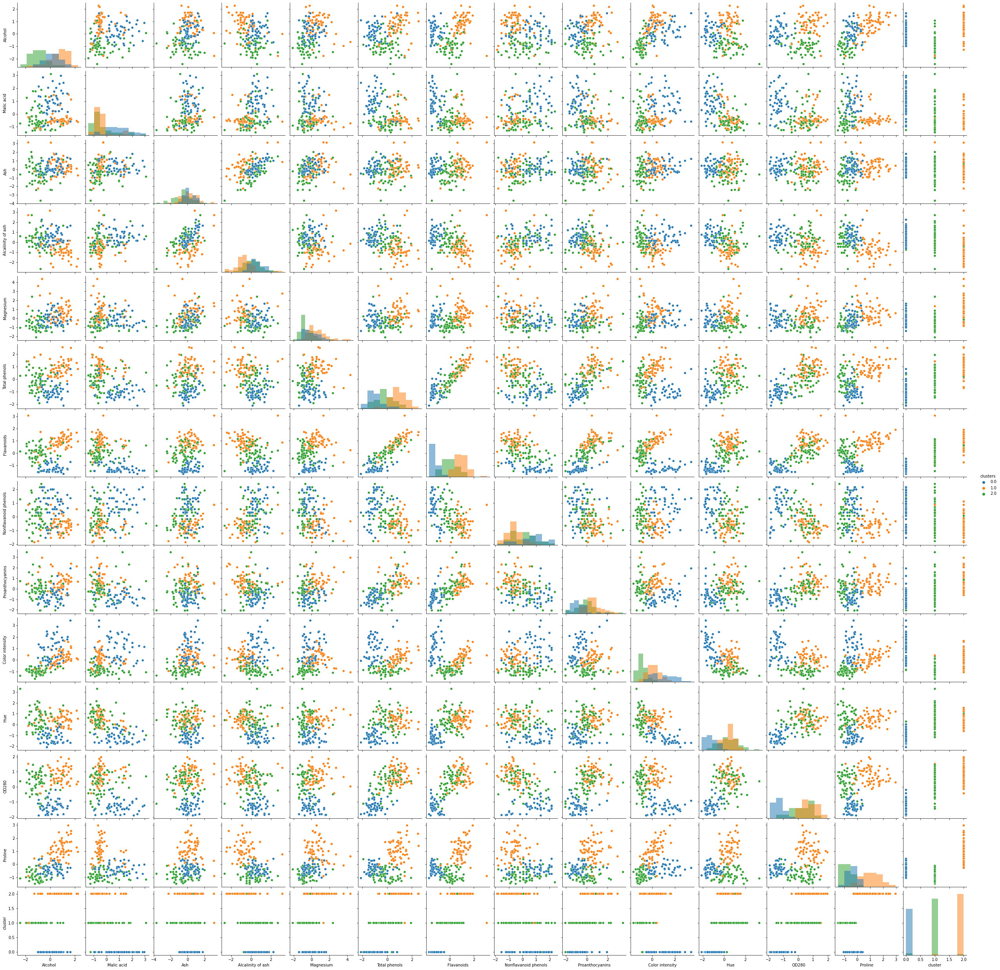

In [29]:
# PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=6)
X = pca.fit_transform(normalizedData)
km_pca = KMeans(n_clusters = 3, random_state=0)
label_pred_KM_PCA = km_pca.fit_predict(X)
normalizedData["clusters"] = label_pred_KM_PCA.astype('float64')
sns.pairplot(normalizedData, hue='clusters', palette= sns.color_palette("tab10", 3),diag_kind='hist', diag_kws=dict(linewidth=0))

In [30]:
from sklearn.metrics import adjusted_rand_score
score_pred_KM = adjusted_rand_score(label, label_pred_KM)
score_pred_KM_PCA = adjusted_rand_score(label, label_pred_KM_PCA)
print('Original Kmeans = ',score_pred_KM, ' PCA Kmeans = ', score_pred_KM_PCA)

Original Kmeans =  0.37111371823084754  PCA Kmeans =  0.8617967592137037


As can be clearly seen from the result above, kmeans clustering of a dataset is more accurate when principal components are created from the data's normalised formed instead of using the kmean clustering on the raw data itself. The accuracy, using PCA, increased by nearly 0.5. This is because PCA reduces the number of features which helps in preserving variance and hence creates better clusters. 